## Path configuration

In [1]:
from pathlib import Path
import os

PROJECT_NAME = "MALDIAlign"

cwd = Path().resolve()

# Walk upwards until we find the project folder
target = None
for parent in [cwd] + list(cwd.parents):
    if parent.name == PROJECT_NAME:
        target = parent
        break

# If the project folder is found and we are not already there, then change cwd
if target is not None and target != cwd:
    os.chdir(target)

print("Working directory:", os.getcwd())

Working directory: /export/usuarios01/agnavarr/MALDIAlign


## Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from utils.config import load_config
from utils.data import load_pkl

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, trustworthiness
from sklearn.utils import resample

ModuleNotFoundError: No module named 'seaborn'

## Data loading

In [ ]:
cfg = load_config()
driams_pkl = cfg["data"]["DRIAMS_REDUCED_PKL"]

In [20]:
driams = load_pkl(driams_pkl)

In [21]:
data, label, meta = driams["data"], driams["label"], driams["meta"]

In [22]:
meta = pd.DataFrame.from_records(list(meta))

## PCA

Normalize each spectrum

In [23]:
# axis=1 to work row by row
# keepdims=True keeps the dimensions needed for per-row normalization to work correctly
data_norm = (data - data.min(axis=1, keepdims=True)) / (
    data.max(axis=1, keepdims=True) - data.min(axis=1, keepdims=True) + 1e-8)

Reduce dimensionality (there are 6000 features)

In [ ]:
my_pca = PCA().fit(data_norm)

In [ ]:
# explained_variance_ returns the amount of variance explained by each of the selected components
# explained_variance_ratio_ returnd the percentage of variance explained by each of the selected components
cumulative_explained_var = np.cumsum(my_pca.explained_variance_)
cumulative_explained_var_ratio = np.cumsum(my_pca.explained_variance_ratio_)

In [ ]:
print(cumulative_explained_var)
print(cumulative_explained_var_ratio)

In [ ]:
plt.plot(np.arange(1, len(cumulative_explained_var_ratio)+1), cumulative_explained_var_ratio)
plt.axhline(0.9, color='r', linestyle='--')
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")

In [ ]:
n_components = np.argmax(cumulative_explained_var_ratio >= 0.9) + 1
print(f"Number of components explaining 90% variance: {n_components}")

This indicates that 551 components are needed to account for 90% of the variance in our dataset. However, this is still a lot for t-SNE, so it is recommended to try and reduce the number of components

In [ ]:
possible_dims = [30, 50, 100]
for dim in possible_dims:
    pca = PCA(n_components=dim).fit(data_norm)
    print(f"Explained variance with {dim} components: {np.sum(pca.explained_variance_ratio_)}")

In [24]:
data_norm_pca = PCA(n_components=100).fit_transform(data_norm)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/pyth

## t-SNE

In [25]:
my_tsne = TSNE(n_components=2)
data_tsne = my_tsne.fit_transform(data_norm_pca)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/pyth

In [10]:
n_samples = 10000
X_pca_sub, X_tsne_sub, y_sub = resample(
    data_norm_pca, data_tsne, label, n_samples=n_samples, stratify=label)

tw = trustworthiness(X_pca_sub, X_tsne_sub, n_neighbors=30)
print(f"Trustworthiness (10k stratified sample): {tw:.3f}")

Trustworthiness (10k stratified sample): 0.990


## Visualization

### Label Encoding & DataFrame Creation  

In [26]:
# Identify unique labels
unique_labels = np.unique(label)
print(unique_labels)

# Assign a number to each label
label_to_idx = {}
for i in range(len(unique_labels)):
    label_to_idx[str(unique_labels[i])] = i
print(label_to_idx)

# Map label dataset 
encoded_label = np.array([label_to_idx[l] for l in label])
print(encoded_label)

['Enterobacter_cloacae_complex' 'Enterococcus_Faecium' 'Escherichia_Coli'
 'Klebsiella_Pneumoniae' 'Pseudomonas_Aeruginosa' 'Staphylococcus_Aureus']
{'Enterobacter_cloacae_complex': 0, 'Enterococcus_Faecium': 1, 'Escherichia_Coli': 2, 'Klebsiella_Pneumoniae': 3, 'Pseudomonas_Aeruginosa': 4, 'Staphylococcus_Aureus': 5}
[3 3 3 ... 0 0 0]


In [27]:
# Create a DataFrame combining coordinates and metadata
tsne_df = pd.DataFrame({
    "x": data_tsne[:, 0],
    "y": data_tsne[:, 1],
    "species": label,
    "year": meta["year"].astype(str), 
    "hospital": meta["hospital"].astype(str)
})

tsne_df

,x,y,species,year,hospital
0,62.490204,12.290854,Klebsiella_Pneumoniae,2018,DRIAMS_B
1,64.361374,4.503094,Klebsiella_Pneumoniae,2018,DRIAMS_B
2,67.202408,8.465827,Klebsiella_Pneumoniae,2018,DRIAMS_B
3,62.589165,4.807696,Klebsiella_Pneumoniae,2018,DRIAMS_B
4,60.889603,27.596910,Klebsiella_Pneumoniae,2018,DRIAMS_B
...,...,...,...,...,...
39776,10.455573,27.957096,Enterobacter_cloacae_complex,2017,DRIAMS_A
39777,16.035511,0.034707,Enterobacter_cloacae_complex,2018,DRIAMS_C
39778,11.161625,10.457145,Enterobacter_cloacae_complex,2018,DRIAMS_C
39779,15.545914,0.817272,Enterobacter_cloacae_complex,2018,DRIAMS_C


### Palettes and Label Orders

In [28]:
# Define categorical orders
species_sorted = sorted(tsne_df["species"].unique())
years_sorted = sorted(tsne_df["year"].unique(), key=lambda x: int(x))
hospitals_sorted = sorted(tsne_df["hospital"].unique())

# Base palette
tab10 = sns.color_palette("tab10")

# Species palette
species_color_map = {
    "Enterobacter_cloacae_complex": tab10[5],  
    "Enterococcus_Faecium": tab10[4],         
    "Escherichia_Coli": tab10[2],             
    "Klebsiella_Pneumoniae": tab10[3],         
    "Pseudomonas_Aeruginosa": tab10[0],       
    "Staphylococcus_Aureus": tab10[1],         
}
species_palette_dict = {sp: species_color_map[sp] for sp in species_sorted}

# Year palette (temporal order)
palette_year = sns.color_palette("tab10", len(years_sorted))
palette_year_dict = {y: palette_year[i] for i, y in enumerate(years_sorted)}

# Hospital palette (alphabetical order)
palette_hosp = sns.color_palette("tab10", len(hospitals_sorted))
palette_hosp_dict = {h: palette_hosp[i] for i, h in enumerate(hospitals_sorted)}

### Global t-SNE — Visualization by Species
Displays the overall t-SNE embedding colored by species to assess inter-species separation in spectral space.

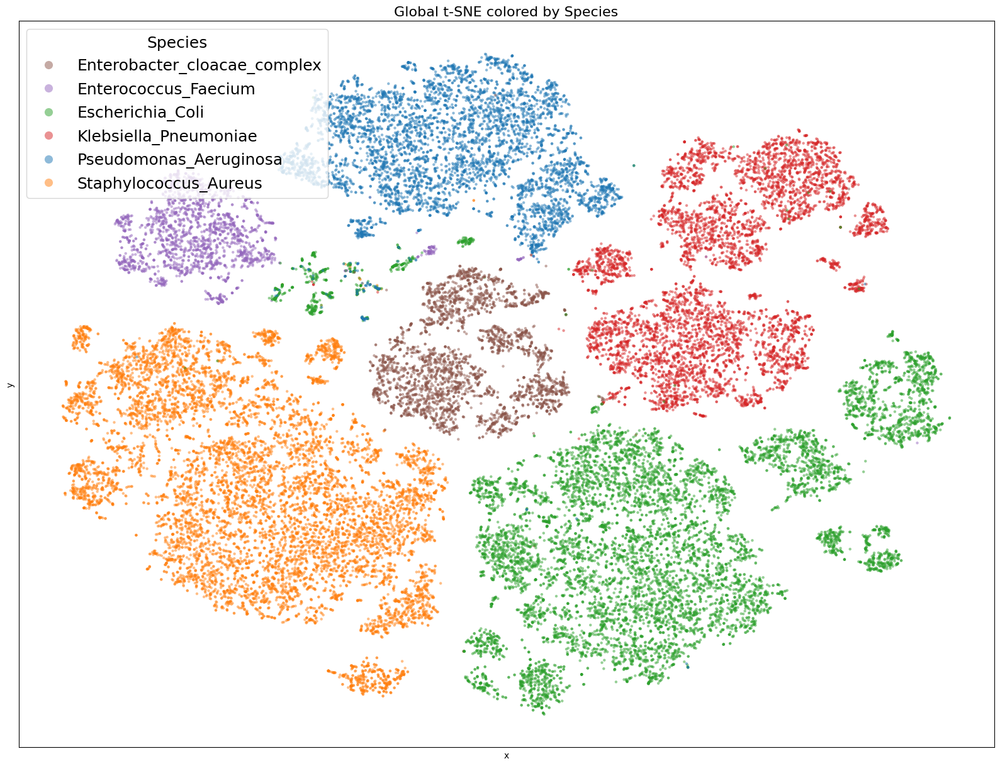

In [29]:
fig, ax = plt.subplots(figsize=(20, 15))
sns.scatterplot(
    data=tsne_df, x="x", y="y",
    hue="species", hue_order=species_sorted,
    palette=species_palette_dict,
    s=10, linewidth=0, ax=ax, alpha=0.5
)
ax.set_title("Global t-SNE colored by Species", fontsize=16)
ax.set_xticks([]); ax.set_yticks([])
ax.legend(loc="upper left", title="Species", title_fontsize= 18, fontsize=18, markerscale=3)
plt.show()

### Global t-SNE — Visualization by Year
Shows the global temporal distribution of the dataset, coloring each sample by acquisition year to detect potential time shifts.


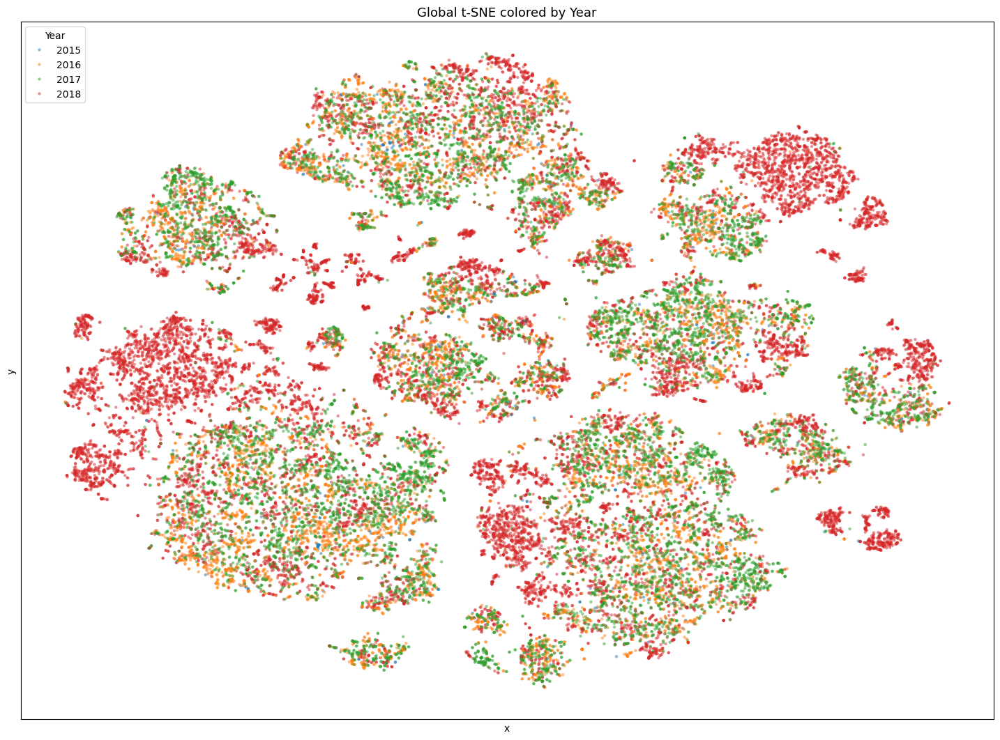

In [30]:
fig, ax = plt.subplots(figsize=(18, 13))
sns.scatterplot(
    data=tsne_df, x="x", y="y",
    hue="year", hue_order=years_sorted,
    palette=palette_year_dict,
    s=10, linewidth=0, ax=ax, alpha=0.5
)
ax.set_title("Global t-SNE colored by Year", fontsize=13)
ax.set_xticks([]); ax.set_yticks([])
ax.legend(loc="upper left", title="Year")
plt.show()

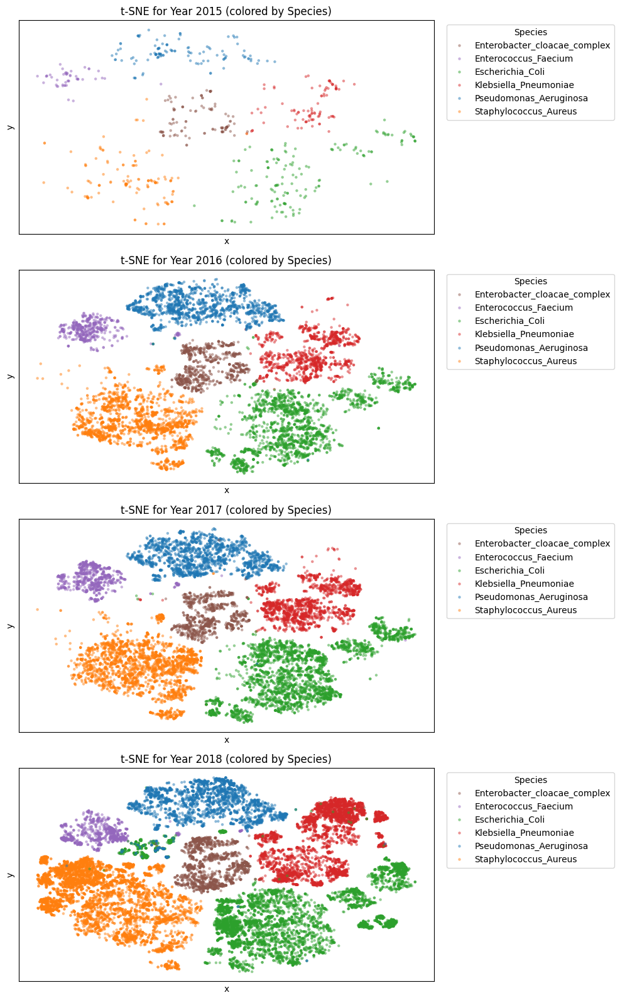

In [16]:
fig, axes = plt.subplots(len(years_sorted), 1, figsize=(10, 4 * len(years_sorted)))

for i, year in enumerate(years_sorted):
    subset = tsne_df[tsne_df["year"] == year]
    sns.scatterplot(
        data=subset,
        x="x", y="y",
        hue="species",
        hue_order=species_sorted,
        palette=species_palette_dict,
        s=10, linewidth=0, ax=axes[i], alpha=0.5
    )
    axes[i].set_title(f"t-SNE for Year {year} (colored by Species)", fontsize=12)
    axes[i].legend(bbox_to_anchor=(1.02, 1), loc='upper left', title="Species")
    axes[i].set_xticks([]); axes[i].set_yticks([])

plt.tight_layout()
plt.show()

### Global t-SNE — Visualization by Hospital
Displays the overall embedding colored by hospital to reveal potential inter-hospital domain shifts.

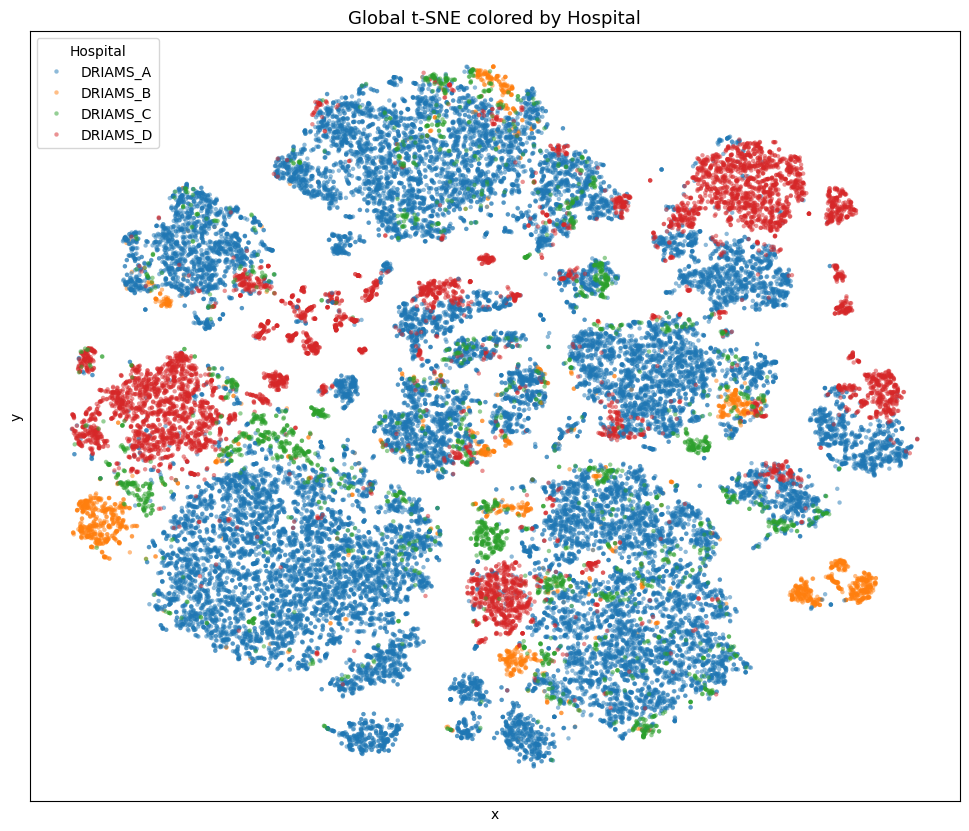

In [17]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(
    data=tsne_df, x="x", y="y",
    hue="hospital", hue_order=hospitals_sorted,
    palette=palette_hosp_dict,
    s=10, alpha=0.5, linewidth=0, ax=ax
)
ax.set_title("Global t-SNE colored by Hospital", fontsize=13)
ax.set_xticks([]); ax.set_yticks([])
ax.legend(loc="upper left", title="Hospital")
plt.show()

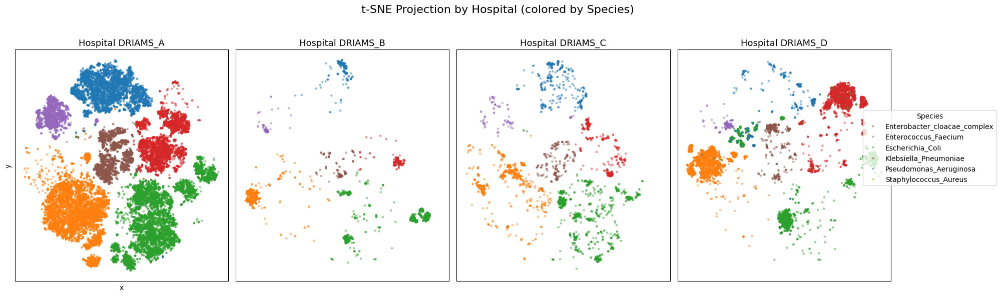

In [18]:
fig, axes = plt.subplots(1, len(hospitals_sorted), figsize=(5 * len(hospitals_sorted), 6), sharex=True, sharey=True)
axes = np.array(axes).flatten()

for i, hosp in enumerate(hospitals_sorted):
    subset = tsne_df[tsne_df["hospital"] == hosp]
    sns.scatterplot(
        data=subset,
        x="x", y="y",
        hue="species",
        hue_order=species_sorted,
        palette=species_palette_dict,
        s=10, linewidth=0, ax=axes[i], alpha=0.5
    )
    axes[i].set_title(f"Hospital {hosp}", fontsize=13)
    axes[i].set_xticks([]); axes[i].set_yticks([])
    axes[i].legend_.remove()

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="center right", title="Species")

plt.suptitle("t-SNE Projection by Hospital (colored by Species)", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


### t-SNE per Species — Global Embedding colored by Hospital
Shows the global embedding filtered by species and colored by hospital to reveal intra-species domain shifts.


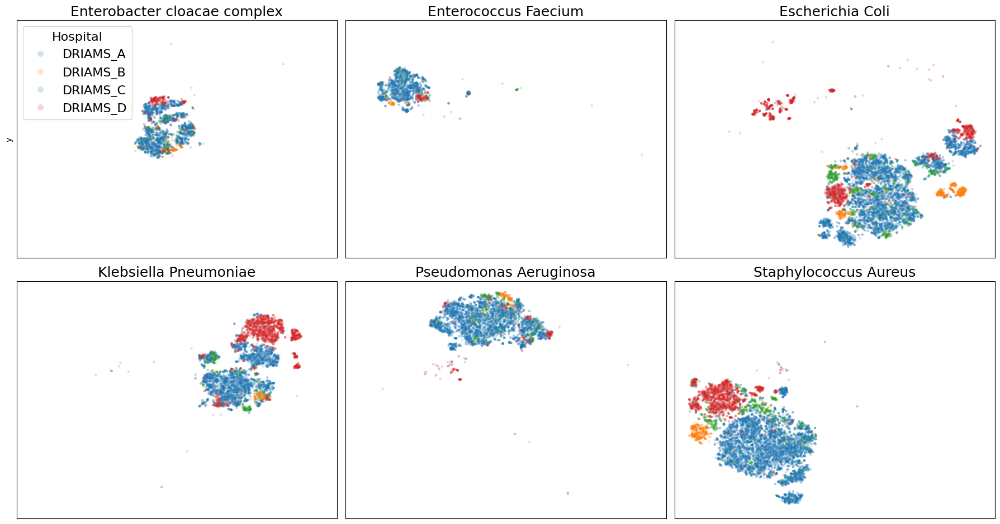

In [22]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.flatten()

for i, sp in enumerate(species_sorted):
    subset = tsne_df[tsne_df["species"] == sp]
    sns.scatterplot(
        data=subset,
        x="x", y="y",
        hue="hospital",
        hue_order=hospitals_sorted,
        palette=palette_hosp_dict,
        s=10, linewidth=0, ax=axes[i], alpha=0.2
    )
    axes[i].set_title(sp.replace("_", " "), fontsize=18)
    axes[i].set_xticks([]); axes[i].set_yticks([])

    # Mostrar la leyenda solo en el primer subplot
    if i == 0:
        axes[i].legend(
            loc="upper left",
            title="Hospital",
            title_fontsize=16,
            fontsize=16,
            markerscale=2.5,
        )
    else:
        axes[i].legend_.remove()

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

#plt.suptitle("t-SNE per Species — colored by Hospital", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### Independent t-SNE per Species — Inter-Hospital Domain Shift
Trains an independent t-SNE for each species, coloring points by hospital, to visually assess intra-species domain shifts across hospitals.


In [23]:
tsne_results = {} 

species_sorted = sorted(np.unique(label))
palette_hosp = sns.color_palette("tab10", len(meta["hospital"].unique()))

for sp in species_sorted:
    mask = (label == sp)
    X = data_norm[mask]
    y_hosp = meta.loc[mask, "hospital"].values

    # PCA 
    X_pca = PCA(n_components=50).fit_transform(X)

    # t-SNE
    tsne = TSNE(n_components=2)
    X_tsne = tsne.fit_transform(X_pca)

    # Store in dictionary
    tsne_results[sp] = {
        "embedding": X_tsne,
        "hospital": y_hosp
    }

print(f"Stored {len(tsne_results)} t-SNE embeddings (one per species).")

Stored 6 t-SNE embeddings (one per species).


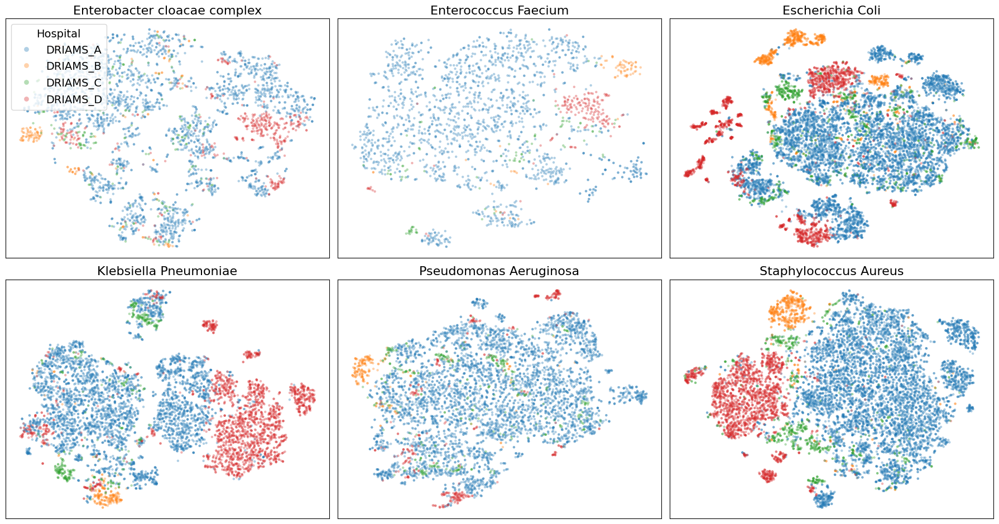

In [37]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, sp in enumerate(species_sorted):
    data_sp = tsne_results[sp]
    X_tsne = data_sp["embedding"]
    y_hosp = data_sp["hospital"]

    df_sp = pd.DataFrame({
        "x": X_tsne[:, 0],
        "y": X_tsne[:, 1],
        "hospital": y_hosp
    })

    sns.scatterplot(
        data=df_sp, x="x", y="y",
        hue="hospital",
        hue_order=hospitals_sorted,
        palette=palette_hosp_dict,
        s=10, linewidth=0, ax=axes[i], alpha=0.35
    )

    axes[i].set_title(sp.replace("_", " "), fontsize=16)
    axes[i].set_xticks([]); axes[i].set_yticks([]); axes[i].set_xlabel(""); axes[i].set_ylabel("")

    if i == 0:
        leg = axes[i].legend(
            title="Hospital",
            fontsize=14,
            title_fontsize=14,
            loc="upper left",
            markerscale=2.0,)
    else:
        axes[i].legend_.remove()

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

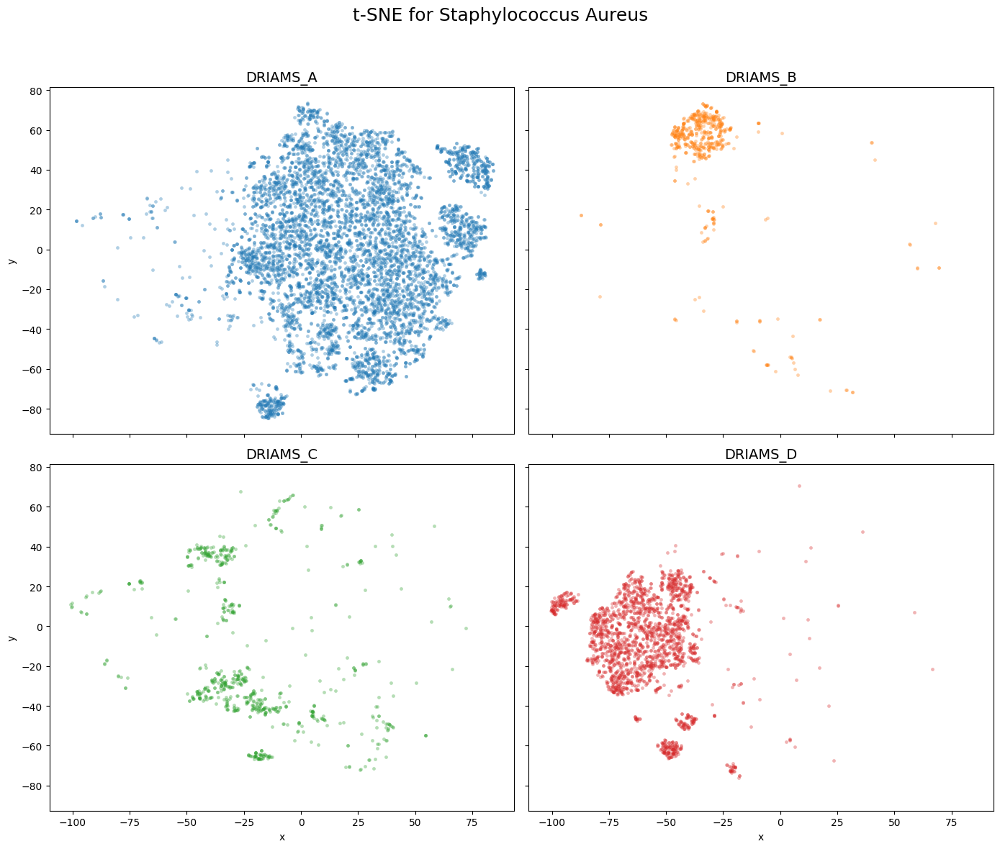

In [32]:
sp = "Staphylococcus_Aureus"  

data_sp = tsne_results[sp]
X_tsne = data_sp["embedding"]
y_hosp = data_sp["hospital"]

df_sp = pd.DataFrame({
    "x": X_tsne[:, 0],
    "y": X_tsne[:, 1],
    "hospital": y_hosp
})

hospitals_sorted = sorted(df_sp["hospital"].unique())

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=True, sharey=True)
axes = axes.flatten()

for i, hosp in enumerate(hospitals_sorted):
    subset = df_sp[df_sp["hospital"] == hosp]

    sns.scatterplot(
        data=subset,
        x="x", y="y",
        s=12, linewidth=0,
        alpha=0.35,
        color=palette_hosp_dict[hosp], 
        ax=axes[i]
    )

    axes[i].set_title(f"{hosp}", fontsize=14)

for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.suptitle(f"t-SNE for {sp.replace('_',' ')}", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

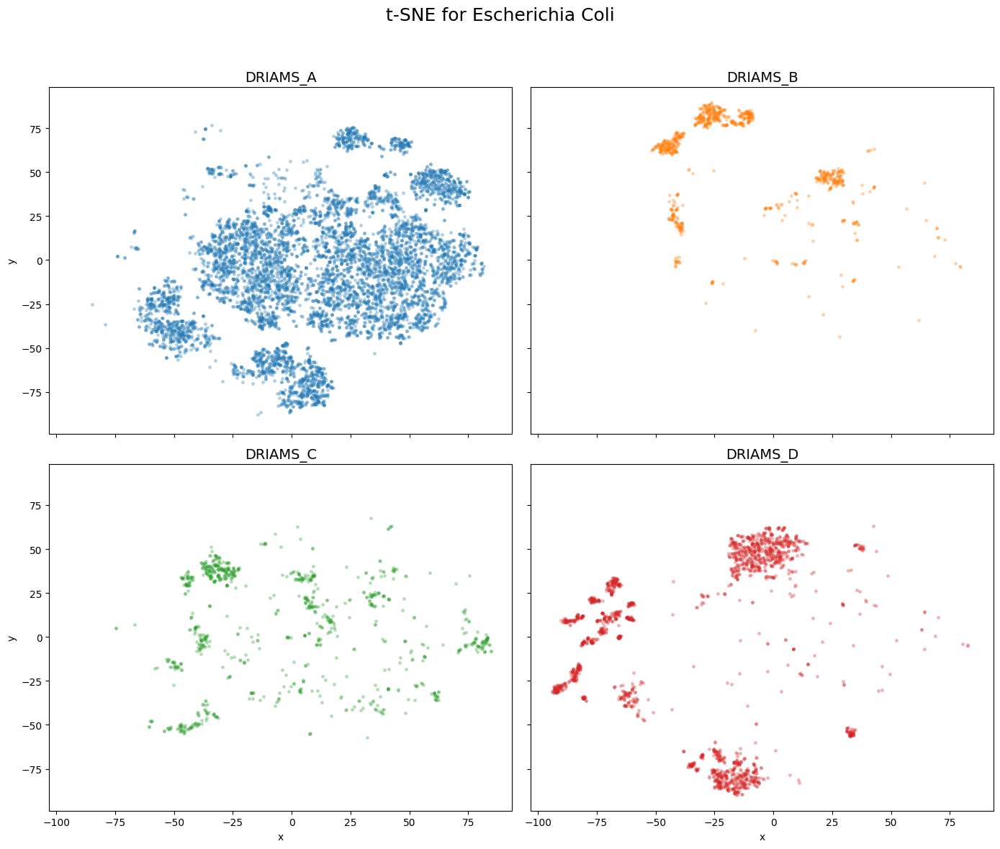

In [36]:
sp = "Escherichia_Coli"  

data_sp = tsne_results[sp]
X_tsne = data_sp["embedding"]
y_hosp = data_sp["hospital"]

df_sp = pd.DataFrame({
    "x": X_tsne[:, 0],
    "y": X_tsne[:, 1],
    "hospital": y_hosp
})

hospitals_sorted = sorted(df_sp["hospital"].unique())

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=True, sharey=True)
axes = axes.flatten()

for i, hosp in enumerate(hospitals_sorted):
    subset = df_sp[df_sp["hospital"] == hosp]

    sns.scatterplot(
        data=subset,
        x="x", y="y",
        s=12, linewidth=0,
        alpha=0.35,
        color=palette_hosp_dict[hosp], 
        ax=axes[i]
    )

    axes[i].set_title(f"{hosp}", fontsize=14)

for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.suptitle(f"t-SNE for {sp.replace('_',' ')}", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Independent t-SNE per Species — Temporal Distribution Analysis
Independent t-SNE per species colored by year, revealing potential intra-species time shifts in spectral representations across acquisition years.

In [25]:
tsne_results_year = {}
species_sorted = sorted(np.unique(label))
palette_year = sns.color_palette("tab10", len(meta["year"].unique()))

for sp in species_sorted:
    mask = (label == sp)
    X = data_norm[mask]
    y_year = meta.loc[mask, "year"].astype(str).values

    X_pca = PCA(n_components=50).fit_transform(X)

    tsne = TSNE(n_components=2)
    X_tsne = tsne.fit_transform(X_pca)

    tsne_results_year[sp] = {
        "embedding": X_tsne,
        "year": y_year
    }

print(f"Stored {len(tsne_results_year)} t-SNE embeddings (one per species, colored by year).")

Stored 6 t-SNE embeddings (one per species, colored by year).


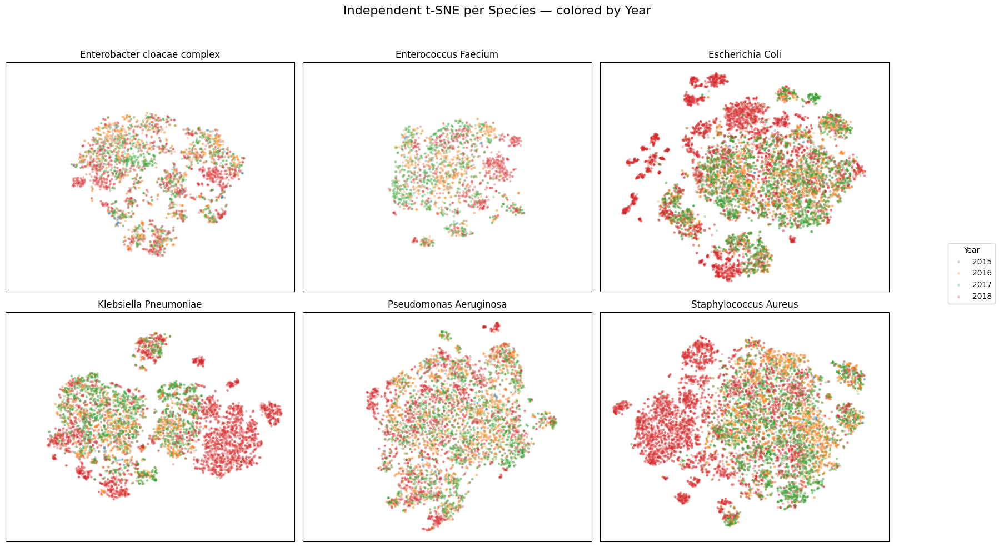

In [28]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.flatten()

years_sorted = sorted(meta["year"].astype(str).unique(), key=lambda x: int(x))
palette_year_dict = {y: palette_year[i % len(palette_year)] for i, y in enumerate(years_sorted)}

for i, sp in enumerate(species_sorted):
    emb = tsne_results_year[sp]["embedding"]
    y_year = tsne_results_year[sp]["year"]

    sns.scatterplot(
        x=emb[:, 0], y=emb[:, 1],
        hue=y_year,
        hue_order=years_sorted,
        palette=palette_year_dict,
        s=10, linewidth=0, ax=axes[i], alpha=0.3
    )

    axes[i].set_title(sp.replace("_", " "), fontsize=12)
    axes[i].set_xticks([]); axes[i].set_yticks([])
    axes[i].legend_.remove()

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="center right", title="Year")

plt.suptitle("Independent t-SNE per Species — colored by Year", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

## Visualization (w/o DRIAMS-D)

In [33]:
mask_no_D = meta["hospital"] != "DRIAMS_D"
data_no_D = data[mask_no_D]
label_no_D = label[mask_no_D]
meta_no_D = meta.loc[mask_no_D].reset_index(drop=True)

In [34]:
data_no_D_norm = (data_no_D - data_no_D.min(axis=1, keepdims=True)) / (
    data_no_D.max(axis=1, keepdims=True) - data_no_D.min(axis=1, keepdims=True) + 1e-8
)

In [35]:
pca_no_D = PCA(n_components=100)
data_no_D_pca = pca_no_D.fit_transform(data_no_D_norm)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/pyth

In [36]:
tsne_no_D = TSNE(n_components=2,)
data_no_D_tsne = tsne_no_D.fit_transform(data_no_D_pca)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/pyth

### Label Encoding & DataFrame Creation  

In [38]:
# Create a DataFrame combining coordinates and metadata
tsne_df_no_D = pd.DataFrame({
    "x": data_no_D_tsne[:, 0],
    "y": data_no_D_tsne[:, 1],
    "species": label_no_D,
    "year": meta_no_D["year"].astype(str),
    "hospital": meta_no_D["hospital"].astype(str),
})

tsne_df_no_D

,x,y,species,year,hospital
0,48.556911,31.776833,Klebsiella_Pneumoniae,2018,DRIAMS_B
1,42.897984,24.388428,Klebsiella_Pneumoniae,2018,DRIAMS_B
2,45.172310,27.689611,Klebsiella_Pneumoniae,2018,DRIAMS_B
3,41.956738,22.994919,Klebsiella_Pneumoniae,2018,DRIAMS_B
4,46.550396,51.967033,Klebsiella_Pneumoniae,2018,DRIAMS_B
...,...,...,...,...,...
32468,19.026506,14.022310,Enterobacter_cloacae_complex,2017,DRIAMS_A
32469,-9.887869,22.909414,Enterobacter_cloacae_complex,2018,DRIAMS_C
32470,15.650409,6.914503,Enterobacter_cloacae_complex,2018,DRIAMS_C
32471,-9.526936,23.510206,Enterobacter_cloacae_complex,2018,DRIAMS_C


### Palettes and Label Orders

In [48]:
species_sorted = sorted(tsne_df_no_D["species"].unique())
years_sorted = sorted(tsne_df_no_D["year"].unique(), key=lambda x: int(x))
hospitals_sorted = sorted(tsne_df_no_D["hospital"].unique())

tab10 = sns.color_palette("tab10")

species_color_map = {
    "Enterobacter_cloacae_complex": tab10[5],
    "Enterococcus_Faecium": tab10[4],
    "Escherichia_Coli": tab10[2],
    "Klebsiella_Pneumoniae": tab10[3],
    "Pseudomonas_Aeruginosa": tab10[0],
    "Staphylococcus_Aureus": tab10[1],
}
species_palette_dict = {sp: species_color_map[sp] for sp in species_sorted}

palette_year = sns.color_palette("tab10", len(years_sorted))
palette_year_dict = {y: palette_year[i] for i, y in enumerate(years_sorted)}

palette_hosp = sns.color_palette("tab10", len(hospitals_sorted))
palette_hosp_dict = {h: palette_hosp[i] for i, h in enumerate(hospitals_sorted)}

### Global t-SNE — Visualization by Species
Displays the overall t-SNE embedding colored by species to assess inter-species separation in spectral space.

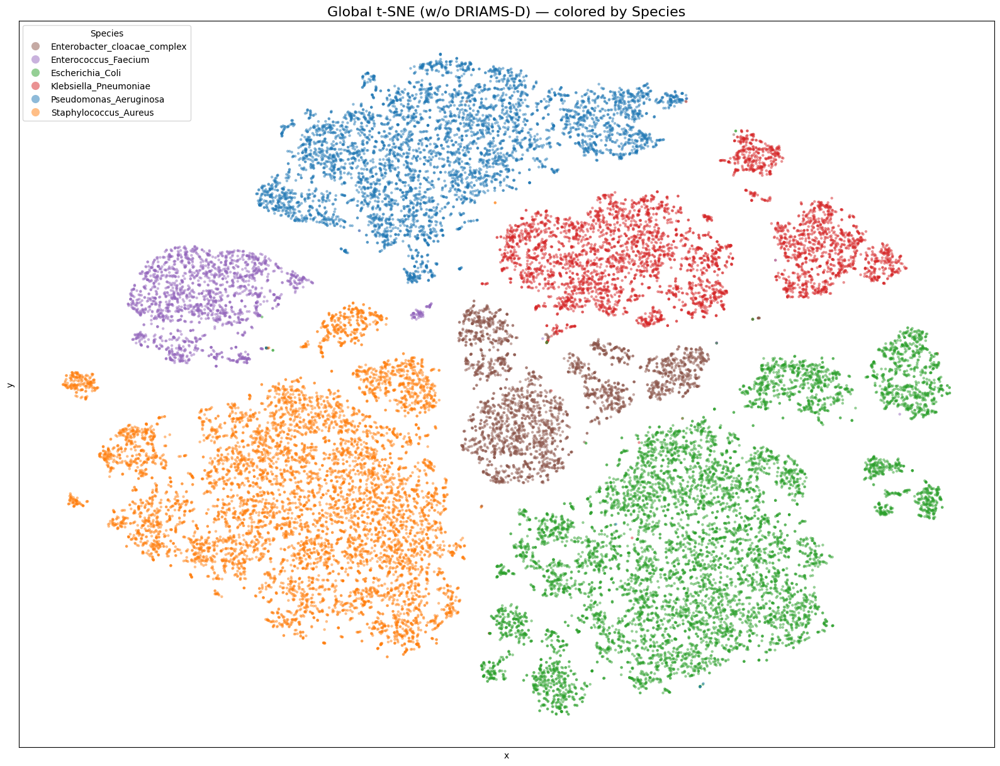

In [49]:
fig, ax = plt.subplots(figsize=(20, 15))
sns.scatterplot(
    data=tsne_df_no_D, x="x", y="y",
    hue="species", hue_order=species_sorted,
    palette=species_palette_dict,
    s=10, linewidth=0, alpha=0.5, ax=ax
)
ax.set_title("Global t-SNE (w/o DRIAMS-D) — colored by Species", fontsize=16)
ax.set_xticks([]); ax.set_yticks([])
ax.legend(loc="upper left", title="Species", markerscale=3)
plt.show()

### Global t-SNE — Visualization by Year
Shows the global temporal distribution of the dataset, coloring each sample by acquisition year to detect potential time shifts.


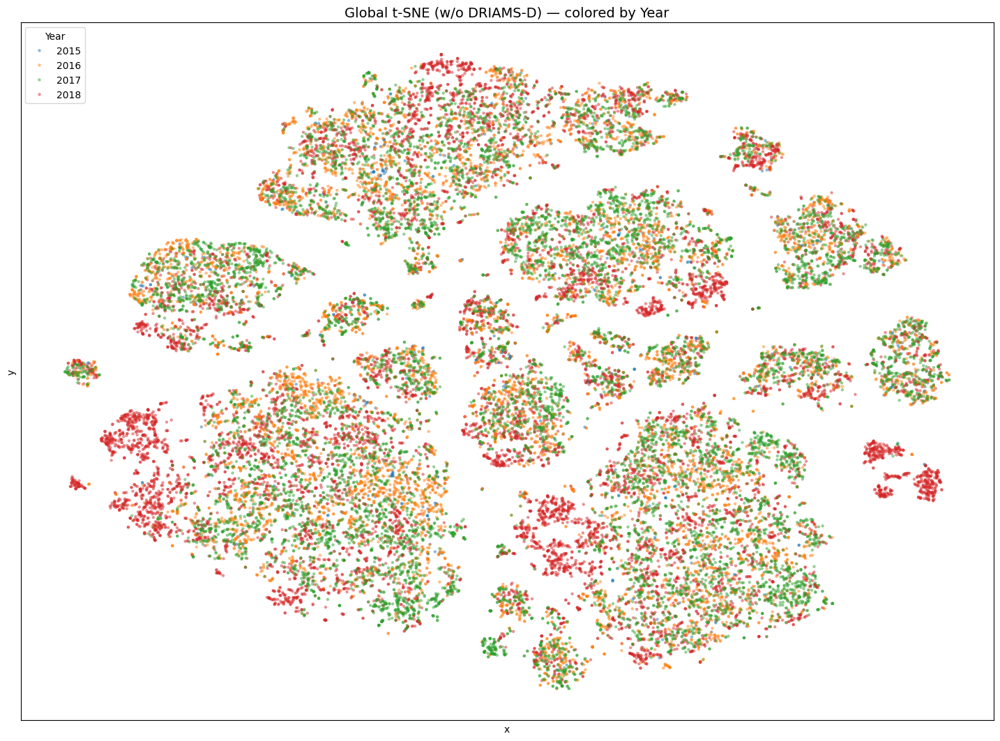

In [50]:
fig, ax = plt.subplots(figsize=(18, 13))
sns.scatterplot(
    data=tsne_df_no_D, x="x", y="y",
    hue="year", hue_order=years_sorted,
    palette=palette_year_dict,
    s=10, linewidth=0, alpha=0.5, ax=ax
)
ax.set_title("Global t-SNE (w/o DRIAMS-D) — colored by Year", fontsize=14)
ax.set_xticks([]); ax.set_yticks([])
ax.legend(loc="upper left", title="Year")
plt.show()

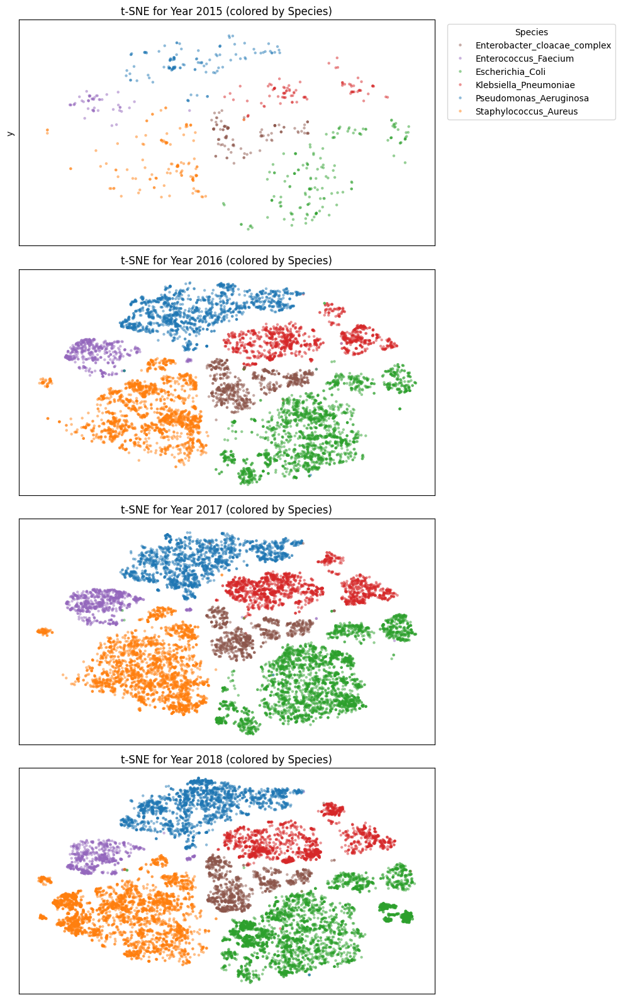

In [65]:
# t-SNE per Year (w/o DRIAMS-D) — colored by Species

years_sorted = sorted(
    tsne_df_no_D["year"].unique(),
    key=lambda x: int(x)
)

species_sorted = sorted(tsne_df_no_D["species"].unique())

fig, axes = plt.subplots(
    len(years_sorted),
    1,
    figsize=(10, 4 * len(years_sorted)),
    sharex=True,
    sharey=True
)

# Si solo hay un año, axes no es iterable
if len(years_sorted) == 1:
    axes = [axes]

for i, year in enumerate(years_sorted):
    subset = tsne_df_no_D[tsne_df_no_D["year"] == year]

    sns.scatterplot(
        data=subset,
        x="x", y="y",
        hue="species",
        hue_order=species_sorted,
        palette=species_palette_dict,
        s=10,
        linewidth=0,
        alpha=0.5,
        ax=axes[i]
    )

    axes[i].set_title(
        f"t-SNE for Year {year} (colored by Species)",
        fontsize=12
    )
    axes[i].set_xticks([])
    axes[i].set_yticks([])

    # Leyenda solo en el primer subplot
    if i == 0:
        axes[i].legend(
            bbox_to_anchor=(1.02, 1),
            loc="upper left",
            title="Species",
            fontsize=10
        )
    else:
        axes[i].legend_.remove()

plt.tight_layout()
plt.show()

### Global t-SNE — Visualization by Hospital
Displays the overall embedding colored by hospital to reveal potential inter-hospital domain shifts.

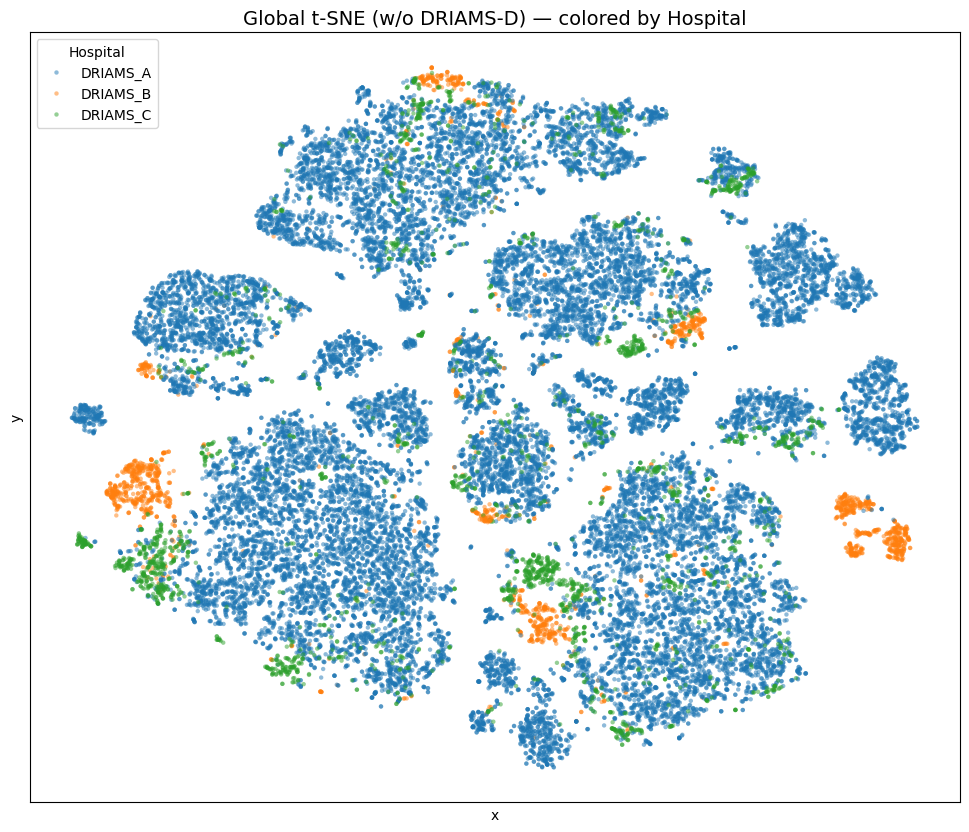

In [52]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(
    data=tsne_df_no_D, x="x", y="y",
    hue="hospital", hue_order=hospitals_sorted,
    palette=palette_hosp_dict,
    s=10, linewidth=0, alpha=0.5, ax=ax
)
ax.set_title("Global t-SNE (w/o DRIAMS-D) — colored by Hospital", fontsize=14)
ax.set_xticks([]); ax.set_yticks([])
ax.legend(loc="upper left", title="Hospital")
plt.show()

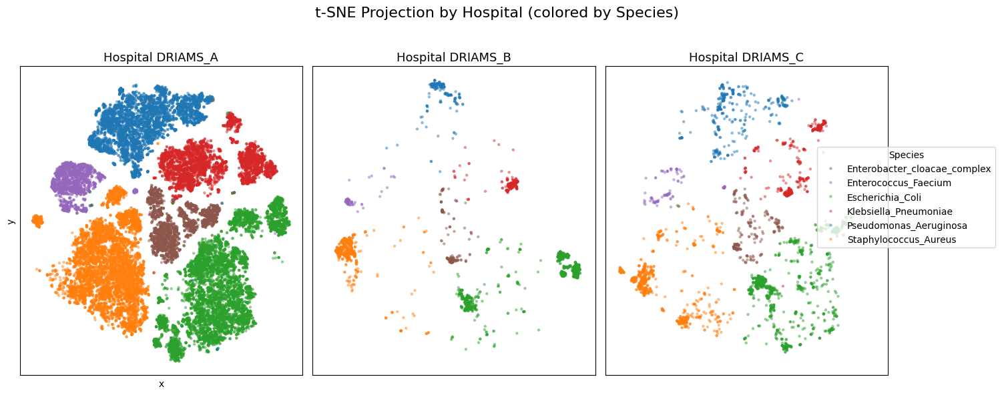

In [64]:
fig, axes = plt.subplots(1, len(hospitals_sorted), figsize=(5 * len(hospitals_sorted), 6), sharex=True, sharey=True)
axes = np.array(axes).flatten()

for i, hosp in enumerate(hospitals_sorted):
    subset = tsne_df_no_D[tsne_df_no_D["hospital"] == hosp]
    sns.scatterplot(
        data=subset,
        x="x", y="y",
        hue="species",
        hue_order=species_sorted,
        palette=species_palette_dict,
        s=10, linewidth=0, ax=axes[i], alpha=0.5
    )
    axes[i].set_title(f"Hospital {hosp}", fontsize=13)
    axes[i].set_xticks([]); axes[i].set_yticks([])
    axes[i].legend_.remove()

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="center right", title="Species")

plt.suptitle("t-SNE Projection by Hospital (colored by Species)", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


### t-SNE per Species — Global Embedding colored by Hospital
Shows the global embedding filtered by species and colored by hospital to reveal intra-species domain shifts.


In [56]:
tsne_results_no_D = {}

for sp in species_sorted:
    mask = (label_no_D == sp)
    X = data_no_D_norm[mask]
    y_hosp = meta_no_D.loc[mask, "hospital"].values

    X_pca = PCA(n_components=50, random_state=42).fit_transform(X)
    X_tsne = TSNE(
        n_components=2,
        perplexity=30,
        random_state=42,
        init="pca"
    ).fit_transform(X_pca)

    tsne_results_no_D[sp] = {
        "embedding": X_tsne,
        "hospital": y_hosp
    }

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/pyth

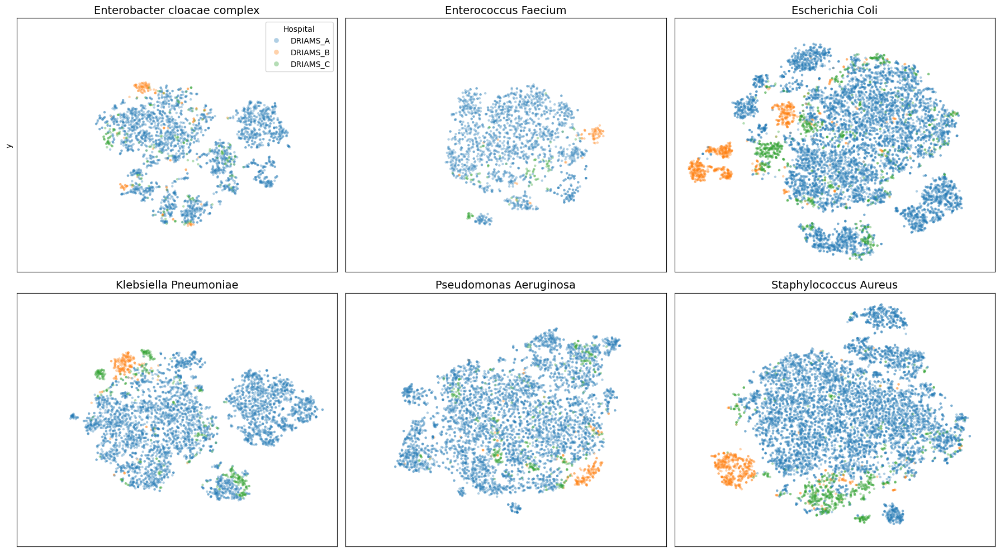

In [57]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.flatten()

for i, sp in enumerate(species_sorted):
    emb = tsne_results_no_D[sp]["embedding"]
    y_hosp = tsne_results_no_D[sp]["hospital"]

    df_sp = pd.DataFrame({
        "x": emb[:, 0],
        "y": emb[:, 1],
        "hospital": y_hosp
    })

    sns.scatterplot(
        data=df_sp, x="x", y="y",
        hue="hospital", hue_order=hospitals_sorted,
        palette=palette_hosp_dict,
        s=10, linewidth=0, alpha=0.35, ax=axes[i]
    )

    axes[i].set_title(sp.replace("_", " "), fontsize=14)
    axes[i].set_xticks([]); axes[i].set_yticks([])

    if i == 0:
        axes[i].legend(title="Hospital", markerscale=2)
    else:
        axes[i].legend_.remove()

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

### Independent t-SNE per Species — Inter-Hospital Domain Shift
Trains an independent t-SNE for each species, coloring points by hospital, to visually assess intra-species domain shifts across hospitals.


In [58]:
tsne_results = {}

species_sorted = sorted(np.unique(label_no_D))
hospitals_sorted = sorted(meta_no_D["hospital"].unique())
palette_hosp = sns.color_palette("tab10", len(hospitals_sorted))
palette_hosp_dict = {h: palette_hosp[i] for i, h in enumerate(hospitals_sorted)}

for sp in species_sorted:
    mask = (label_no_D == sp)

    X = data_no_D_norm[mask]
    y_hosp = meta_no_D.loc[mask, "hospital"].values

    # PCA (por especie, sin D)
    X_pca = PCA(n_components=50, random_state=42).fit_transform(X)

    # t-SNE (por especie, sin D)
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X_pca)

    tsne_results[sp] = {
        "embedding": X_tsne,
        "hospital": y_hosp
    }

print(f"Stored {len(tsne_results)} t-SNE embeddings (one per species, w/o DRIAMS-D).")

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/pyth

Stored 6 t-SNE embeddings (one per species, w/o DRIAMS-D).


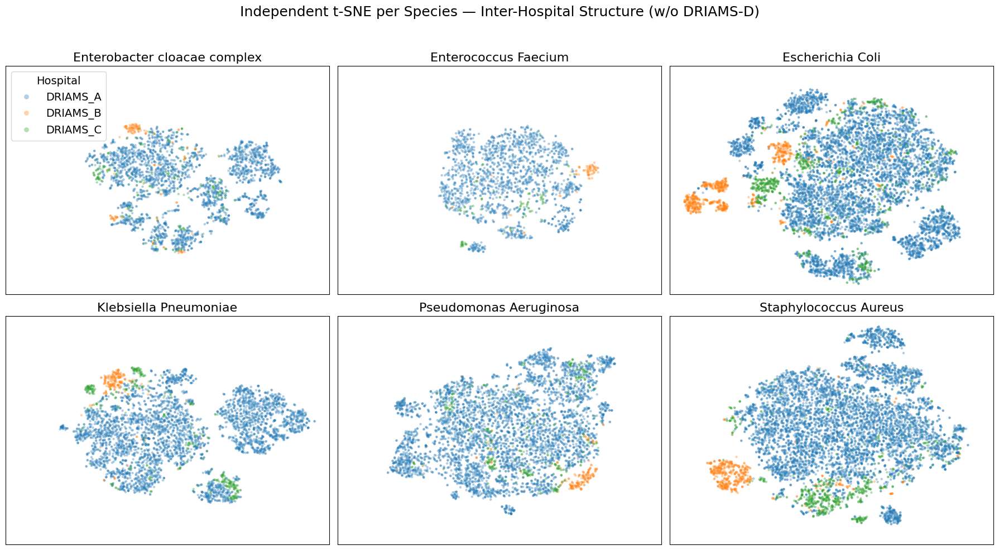

In [59]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.flatten()

for i, sp in enumerate(species_sorted):
    data_sp = tsne_results[sp]

    df_sp = pd.DataFrame({
        "x": data_sp["embedding"][:, 0],
        "y": data_sp["embedding"][:, 1],
        "hospital": data_sp["hospital"]
    })

    sns.scatterplot(
        data=df_sp,
        x="x", y="y",
        hue="hospital",
        hue_order=hospitals_sorted,
        palette=palette_hosp_dict,
        s=10,
        linewidth=0,
        alpha=0.35,
        ax=axes[i]
    )

    axes[i].set_title(sp.replace("_", " "), fontsize=16)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

    if i == 0:
        axes[i].legend(
            title="Hospital",
            fontsize=14,
            title_fontsize=14,
            loc="upper left",
            markerscale=2.0,
        )
    else:
        axes[i].legend_.remove()

# Apagar subplots vacíos si los hay
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.suptitle(
    "Independent t-SNE per Species — Inter-Hospital Structure (w/o DRIAMS-D)",
    fontsize=18
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### Independent t-SNE per Species — Temporal Distribution Analysis
Independent t-SNE per species colored by year, revealing potential intra-species time shifts in spectral representations across acquisition years.

In [61]:
tsne_results_year_no_D = {}

species_sorted = sorted(np.unique(label_no_D))

for sp in species_sorted:
    mask = (label_no_D == sp)

    X = data_no_D_norm[mask]
    y_year = meta_no_D.loc[mask, "year"].astype(str).values

    # PCA (per species, w/o D)
    X_pca = PCA(n_components=50, random_state=42).fit_transform(X)

    # t-SNE (per species, w/o D)
    X_tsne = TSNE(
        n_components=2,
        perplexity=30,
        random_state=42,
        init="pca"
    ).fit_transform(X_pca)

    tsne_results_year_no_D[sp] = {
        "embedding": X_tsne,
        "year": y_year
    }

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.11/lib/pyth

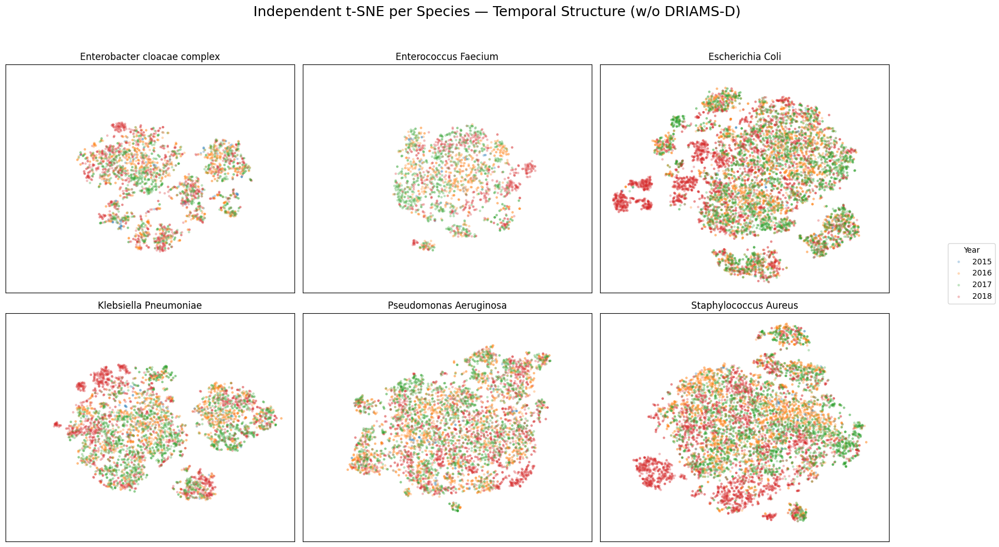

In [62]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.flatten()

years_sorted = sorted(
    meta_no_D["year"].astype(str).unique(),
    key=lambda x: int(x)
)

palette_year = sns.color_palette("tab10", len(years_sorted))
palette_year_dict = {y: palette_year[i] for i, y in enumerate(years_sorted)}

for i, sp in enumerate(species_sorted):
    data_sp = tsne_results_year_no_D[sp]

    sns.scatterplot(
        x=data_sp["embedding"][:, 0],
        y=data_sp["embedding"][:, 1],
        hue=data_sp["year"],
        hue_order=years_sorted,
        palette=palette_year_dict,
        s=10,
        linewidth=0,
        alpha=0.3,
        ax=axes[i]
    )

    axes[i].set_title(sp.replace("_", " "), fontsize=12)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")
    axes[i].legend_.remove()

# Apagar subplots vacíos
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

# Leyenda global
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="center right", title="Year")

plt.suptitle(
    "Independent t-SNE per Species — Temporal Structure (w/o DRIAMS-D)",
    fontsize=18
)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()